<a href="https://colab.research.google.com/github/MaCuur/AI_EGs/blob/main/rainfall_forecasting_using_lstm_CDMX.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Adaptation for CDMX

<em><h5 style="line-height: 2;color: #17202A"> @KOUSTUBHK has already run the LSTM model on the Tehran city of my rainfall dataset. It's highly interesting and informative and you can access it through the link below. But the current notebook runs a similar model on all cities in the dataset to provide an overview of rainfall across the country and forecast it until 2030.
</h5>
  <li > <a href="https://www.kaggle.com/datasets/mohammadrahdanmofrad/average-monthly-precipitation-of-iranian-cities"><u>Rainfall of Iranian cities</u></li></a>
    <li style="line-height: 3;"> <a href="https://www.kaggle.com/code/kkhandekar/multistep-time-series-forecasting-with-lstm"><u>Multistep time series forecasting with LSTM</u></li></a>
</em>

# Importing Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.model_selection import *
import tensorflow.keras as keras
from tqdm.keras import TqdmCallback
import warnings
warnings.filterwarnings('ignore')

In [ ]:
data = pd.read_csv("CIUDAD DE MEXICO_9002_1961_precipitacion.csv")
data[:5]

,precipitacion_mm,mes,dia,año
0,0.0,1.0,1.0,1961.0
1,0.0,1.0,2.0,1961.0
2,0.0,1.0,3.0,1961.0
3,0.0,1.0,4.0,1961.0
4,0.0,1.0,5.0,1961.0


# Data Preprocessing and Visualization

In [ ]:
#Convert the date_column to month to
df1 = pd.DataFrame(data)
df1['date'] = pd.to_datetime(df1['date'])
df1['date'] = df1['date'].dt.strftime('%b')
df1

NameError: name 'pd' is not defined

In [ ]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
2RSMX,1363.0,2.794263,6.779649,0.00,0.00,0.00,1.00,72.00
ABRMR,17.0,0.000000,0.000000,0.00,0.00,0.00,0.00,0.00
ACAHD,1.0,0.000000,NaN,0.00,0.00,0.00,0.00,0.00
ACAPB,537.0,0.787542,4.818824,0.00,0.00,0.00,0.00,74.00
ACHMR,1384.0,3.065643,8.478427,0.00,0.00,0.00,1.00,95.20
...,...,...,...,...,...,...,...,...
sgregorio,1.0,0.000000,NaN,0.00,0.00,0.00,0.00,0.00
tacuba,1.0,0.000000,NaN,0.00,0.00,0.00,0.00,0.00
tlcmr,1.0,67.000000,NaN,67.00,67.00,67.00,67.00,67.00
topilejo,1.0,0.010000,NaN,0.01,0.01,0.01,0.01,0.01


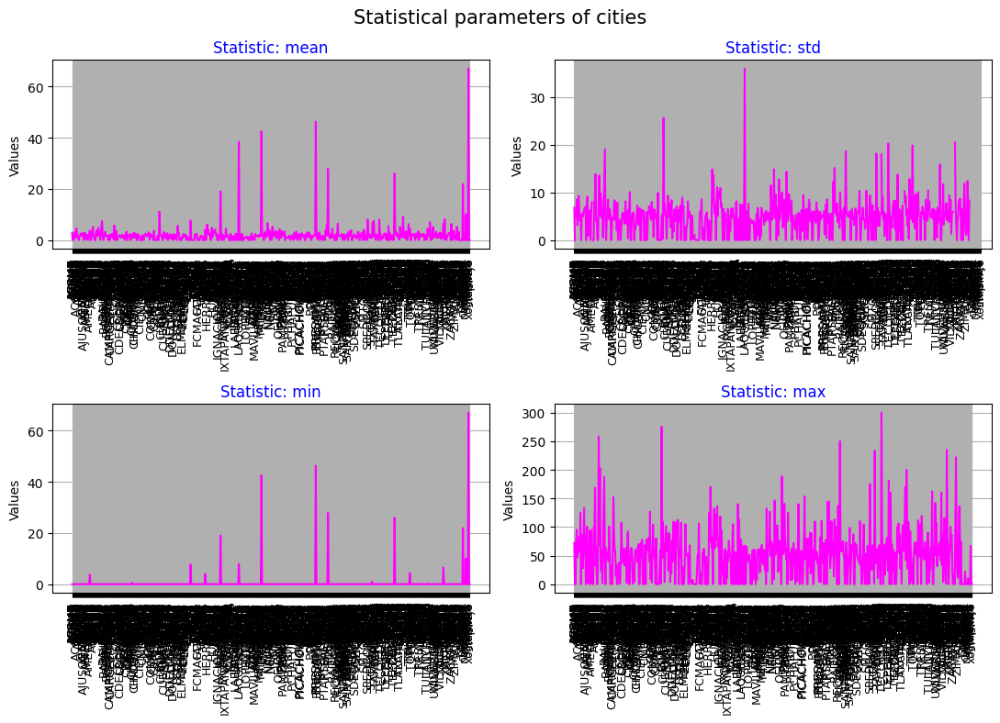

In [ ]:
cities = df1.columns[1:]
statistics = ['mean', 'std', 'min', 'max']
fig, axs = plt.subplots(2, 2, figsize=(11, 8))
fig.suptitle('Statistical parameters of cities', fontsize=15)

for i, statis in enumerate(statistics):
#row 0,col 0:Statistic mean / row 0,col 1:Statistic std
#row 1,col 0:Statistic min / row 1,col 1:Statistic max
    row = i // 2
    col = i % 2
    axs[row, col].plot(cities, df1.describe().T[statis], color='Magenta')
    axs[row, col].set_title(f'Statistic: {statis}', color='blue')
    axs[row, col].set_ylabel('Values')
    axs[row, col].grid()
    axs[row, col].tick_params(axis='x', rotation=90)
    axs[row, col].set_xticklabels(cities, fontsize=9)
plt.tight_layout()
plt.show()

<div style="margin: 0 auto; border-radius: 30px; padding: 7px; font-size: 15px; width: 90%; border: 1px solid #330033; background-color: #CCFF33; color: #330066;">
  <h5 style="line-height: 2.5; font-size: 15px;"> According to the charts above:</h5>
  <ul>
  <li> The highest average monthly rainfall was for Ilam, Rasht and Khorramabad, respectively.</li>
  <li> The lowest average monthly rainfall was for Zahedan, Yazd and Isfahan, respectively.</li>
  <li> Ardabil, Bojnord, Sari, and Zanjan have consistently experienced non-zero average monthly rainfall.</li>
</ul>
</div>


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 1. Load your rainfall dataset
df = data

# 2. Convert the first column (dates) to datetime and rename it
df.iloc[:, 0] = pd.to_datetime(df.iloc[:, 0])
df = df.rename(columns={df.columns[0]: 'Date'})

# 3. Automatically get the station names (all columns except 'Date')
variables = df.columns[1:].tolist()

# 4. Define number of plots and layout
num_plots = len(variables)
num_rows = (num_plots + 1) // 2   # automatically compute rows for 2 columns
num_cols = 2

# 5. Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, num_rows * 2.5))
axes = axes.flatten()

# 6. Plot each station
for i, var in enumerate(variables):
    axes[i].plot(df['Date'], df[var])
    axes[i].set_title(var, fontsize=10)
    axes[i].set_xlabel('Date')
    axes[i].set_ylabel('Rainfall (mm)')

# 7. Remove any unused subplot panels (if the last row is incomplete)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# 8. Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
variables = ['Ahvaz', 'Arak', 'Ardabil', 'Bandar `Abbas', 'Bandar-e Bushehr',
           'Birjand', 'Bojnurd', 'Esfahan', 'Gorgan', 'Hamadan', 'Ilam', 'Karaj',
           'Kermanshah', 'Kerman', 'Khorramabad', 'Mashhad', 'Orumiyeh', 'Qazvin',
           'Qom', 'Rasht', 'Sanandaj', 'Sari', 'Semnan', 'Shahr-e Kord', 'Shiraz',
           'Tabriz', 'Tehran', 'Yasuj', 'Yazd', 'Zahedan', 'Zanjan']

num_plots = len(variables)
num_rows = 16
num_cols = 2
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 70))
fig.tight_layout()
meanCities= df1.describe().T['mean']
stdCities= df1.describe().T['std']
for i, (var, mean, std) in enumerate(zip(variables, meanCities, stdCities)):
    row = i // num_cols
    col = i % num_cols
    axs[row, col].scatter(df1['date'], df1[var])
    axs[row, col].set_xlabel('date')
    axs[row, col].set_ylabel(var)
    axs[row, col].set_title(f'Monthly rainfall in {var}', color='blue')
    axs[row, col].axhline(y=mean, color='red', linestyle='--', linewidth=2, label=f'Mean {var}')
    axs[row, col].axhline(y=std, color='blue', linestyle='--', label=f'std {var}')
    axs[row, col].legend(loc='best') #'best', 'upper right', 'upper left','upper center'

for i in range(num_plots, num_rows * num_cols):
    fig.delaxes(axs.flatten()[i])
plt.subplots_adjust(wspace=0.2, hspace=0.4)
plt.show()

<div style="margin: 0 auto; border-radius: 30px; padding: 7px; font-size: 15px; width: 90%; border: 1px solid #330033; background-color: #CCFF33; color: #330066;">
  <h5 style="line-height: 2.5; font-size: 15px;"> The relationship between the mean and Std of monthly rainfall can be classified into three categories:</h5>
  <ul>
  <li> Mean > Std: (the average monthly rainfall is higher than the variability or spread observed in the data). This indicates that the rainfall tends to be relatively stable and consistent, with less variation around the higher average value. For example, cities: Ardabil, Gorgan, Karaj, Khorramabad, Orumiyeh, Qazvin, Rasht, Sanandaj, Sari, Tabriz, Tehran, Zanjan.</li>
  <li> Mean = Std: (the average monthly rainfall is lower than the variability or spread of rainfall measurements). This suggests that the average rainfall value coincides with the spread or dispersion of rainfall measurements. For example, cities: Bojnurd, Hamadan, Kermanshah, Qom, Semnan.</li>
  <li> Mean > Std: (the average monthly rainfall is higher than the variability or spread observed in the data).This means that the average rainfall is less, and the measured rainfall amounts show greater variation around this lower average. For example, cities: Ahvaz, Arak, Bandar Abbas, Bandar-e Bushehr, Birjand, Esfahan, Ilam, Kerman, Mashhad, Shahr-e Kord, Shiraz, Yasuj, Yazd, Zahedan.</li>
</ul>
</div>


In [ ]:
#Find und drop the Missing_Value of the dataset
df1.isnull().sum()

# Result

In [ ]:
data.index = data.date
data.drop('date',axis=1,inplace=True)
data.index = pd.to_datetime(data.index)
data = data.resample('A').sum()
# data

#Convert and reshape the data
df = pd.DataFrame(data, columns=cities)
n_input = 30
n_out = 8
X, y = list(), list()

for city in cities:
    city_data = df[city].values.flatten()

    tss = TimeSeriesSplit(n_splits=3)
    for train_index, test_index in tss.split(city_data):
        train = city_data[train_index]
        test = city_data[test_index]

        in_start = 0
        for _ in range(len(train)):
            in_end = in_start + n_input
            out_end = in_end + n_out
            if out_end <= len(train):
                x_input = train[in_start:in_end]
                X.append(x_input)
                y.append(train[in_end:out_end])
            in_start += 1

train_x, train_y = np.array(X), np.array(y)
train_x = train_x.reshape((train_x.shape[0], n_input, 1))
verbose, epochs, batch_size = 0, 200, 32
n_timesteps, n_features, n_outputs = train_x.shape[1], train_x.shape[2], train_y.shape[1]

#Define the model
model = keras.Sequential()
model.add(keras.layers.LSTM(200, activation='relu', input_shape=(n_timesteps, n_features)))
model.add(keras.layers.Dense(100, activation='relu'))
model.add(keras.layers.Dense(n_outputs))
model.compile(loss='mse', optimizer='adam')
# model.compile(loss='mse', optimizer='rmsprop')

#Fit the model
model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, verbose=verbose)
# model.fit(train_x, train_y, epochs=500, batch_size=64, verbose=verbose)
historical_years = list(range(1901, 2023))
forecast_years = list(range(2023, (2023 + 8)))

fig, axs = plt.subplots(31, 2, figsize=(15, 200))
# fig, axs = plt.subplots(31, 2, figsize=(15, 200), gridspec_kw={'width_ratios': [0.45, 0.55], 'height_ratios': [0.45, 0.55]})
# fig, axs = plt.subplots(2, 1, figsize=(15, 10), gridspec_kw={'height_ratios': [0.6, 0.4]})
fig.tight_layout()

for i, city in enumerate(cities):
    city_data = df[city].values.flatten()
    historical_data = city_data[:len(historical_years)]
    axs[i, 0].plot(historical_years, historical_data, label='Yearly Total Rainfall', color='blue')
    axs[i, 0].set_xlabel('Year')
    axs[i, 0].set_ylabel('Total Rainfall')
    axs[i, 0].set_title(f'Yearly Total Rainfall for {city}')
    mean_value = np.mean(historical_data)
    axs[i, 0].axhline(y=mean_value, color='red', linestyle='--', label='Mean rainfall')
    axs[i, 0].legend(loc='best')
    input_x = city_data[-n_input:]
    input_x = input_x.reshape((1, n_input, 1))
    yhat = model.predict(input_x, verbose=0).flatten()
    forecast_data = yhat[:len(forecast_years)]
    axs[i, 1].plot(forecast_years, forecast_data, label='Forecast', color='green')
    axs[i, 1].set_xlabel('Year')
    axs[i, 1].set_ylabel('Total Rainfall')
    axs[i, 1].set_title(f'Yearly Rainfall Forecast for {city}')
    mean_value = np.mean(historical_data)
    max_value = np.max(historical_data)
    min_value = np.min(historical_data)
#     axs[i, 1].axhline(y=max_value, color='blue', linestyle='--', label='Max rainfall')
    axs[i, 1].axhline(y=mean_value, color='red', linestyle='--', label='Mean rainfall')
#     axs[i, 1].axhline(y=min_value, color='red', linestyle='--', label='Min rainfall')
    axs[i, 1].legend(loc='best')
    axs[i, 0].grid(True)
    axs[i, 1].set_xticks(forecast_years)
    axs[i, 1].xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    axs[i, 1].grid(True, which='major')
plt.subplots_adjust(wspace=0.2, hspace=0.4)
plt.show()

<div style="margin: 0 auto; border-radius: 30px; padding: 7px;width: 90%; border: 1px solid #000000; background-color: #CCFF33; color: #000000;">
  <h5 style="line-height: 2.3;"> According to the LSTM model, variations in average monthly rainfall are anticipated in most Iranian cities between 2023 and 2030. Rainfall patterns across cities will exhibit fluctuations, with increases in some years and decreases in others, as illustrated in the corresponding graphs.</h5>
</div>

<div >
  <h5 style= "font-size: 20px;color: #FF00CC"> Best wishes</h5>
 <br>
</div>